# HPC Anomaly Detection: GNN training

## Preliminary steps

In [1]:
! pip install dgl torch_geometric torchviz

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
! if ! [ -d data ]; then cp -r drive/MyDrive/HPCDATA/data .; fi
! if ! [ -d utils ]; then cp -r drive/MyDrive/HPCDATA/utils .; fi

In [4]:
import itertools
import json
import logging
import os
import shutil
import random
from timeit import default_timer

import dgl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from sklearn.metrics import (auc, roc_curve, confusion_matrix,
                            ConfusionMatrixDisplay,precision_recall_curve,
                            classification_report)
from torch import nn
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
from torch_geometric.nn import GCNConv
from torchviz import make_dot

from utils.data_processing import *
from utils.training_simple import *

from tqdm.notebook import tqdm

## Reproducibility

In [5]:
RANDOM_SEED = None # Set a random seed to allow for reproducibility (it will slow down computations)

def set_reproducibility(seed):
  random.seed(seed)
  np.random.seed(seed)
  torch.manual_seed(seed)
  torch.use_deterministic_algorithms(True)
  torch.backends.cudnn.deterministic = True
  torch.backends.cudnn.benchmark = False
  os.environ['CUBLAS_WORKSPACE_CONFIG']=':16:8'

def seed_worker(worker_id):
  worker_seed = torch.initial_seed() % 2**32
  np.random.seed(worker_seed)
  random.seed(worker_seed)

g = None
if RANDOM_SEED is not None:
  g = torch.Generator()
  g.manual_seed(RANDOM_SEED)
  set_reproducibility(RANDOM_SEED)

## Read and process Node Metrics

In [6]:
AGGREGATED_METRICS_PATH = "data/aggregated/"
JOB_TABLE_PATH = 'data/job_table.parquet'
RACKS_DATA_PATH = 'data/racks_spatial_distribution.json'
WINDOW_SIZE = 10
DROP_TH = 100
KEEPNODES = np.arange(460,559).astype(str) # set it no None if you don't want to filter nodes

In [7]:
data = load_metrics(AGGREGATED_METRICS_PATH)
data = process_metrics(data,KEEPNODES,DROP_TH)
data.head()

  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

,timestamp,460,461,463,464,465,467,468,469,470,...,551,552,553,554,555,556,557,558,values,anomalies
0,2022-03-31 02:45:00+00:00,"[0.539976015665201, 0.5405405022263785, 0.5315...","[0.3955845662662844, 0.40540536593020815, 0.37...","[0.4160699413210467, 0.43243241037276337, 0.38...","[0.46081933488446114, 0.47747745580482015, 0.4...","[0.4759347584335139, 0.48648649925787385, 0.45...","[0.5871120678300974, 0.6036036345645427, 0.576...","[0.5280428440482905, 0.5495495456794321, 0.504...","[0.5684167170740713, 0.5945945911114889, 0.540...","[0.612370456611576, 0.6216216355540441, 0.6036...",...,"[0.6630866180691942, 0.6756756385225489, 0.657...","[0.7486076813237196, 0.7477477283971609, 0.747...","[0.7484088436863042, 0.7477477283971609, 0.756...","[0.7758549927365993, 0.7837838162927697, 0.783...","[0.8110581160655834, 0.8108107748187192, 0.819...","[0.7800315542463185, 0.7837838162927697, 0.783...","[0.8337308265224157, 0.8378378192612744, 0.837...","[25.564450412326387, 25.799999237060547, 25.39...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
1,2022-03-31 03:00:00+00:00,"[0.5129274204992378, 0.5045045002473754, 0.522...","[0.3570007782344892, 0.3513513629617035, 0.360...","[0.3747015766319405, 0.36936936395120507, 0.37...","[0.41865537686469456, 0.4144144093832618, 0.42...","[0.4331741661110016, 0.4234234528363155, 0.432...","[0.5624501919608657, 0.5585585891324859, 0.558...","[0.49602203334669837, 0.4954954567943217, 0.49...","[0.5397770566372865, 0.5495495456794321, 0.531...","[0.590095239343826, 0.5855855476584353, 0.5945...",...,"[0.6591088941968907, 0.6666666809861009, 0.639...","[0.7482098846583893, 0.7477477283971609, 0.738...","[0.749403031873382, 0.7477477283971609, 0.7567...","[0.7750595207964381, 0.7747747728397161, 0.774...","[0.810262401344424, 0.8108107748187192, 0.8108...","[0.7800316756368176, 0.7837838162927697, 0.783...","[0.832338720279509, 0.8378378192612744, 0.8378...","[25.533336046006944, 25.799999237060547, 25.39...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
2,2022-03-31 03:15:00+00:00,"[0.5151152414633041, 0.5045045002473754, 0.522...","[0.360381867804047, 0.3513513629617035, 0.3603...","[0.37708811384292334, 0.3783784074042587, 0.37...","[0.4196496864422715, 0.4234234528363155, 0.423...","[0.4321796744476762, 0.43243241037276337, 0.43...","[0.5626489689030316, 0.5675675466689337, 0.558...","[0.492442227530224, 0.4954954567943217, 0.4774...","[0.5385837880317951, 0.5495495456794321, 0.522...","[0.5922830603078925, 0.6036036345645427, 0.594...",...,"[0.649562259790963, 0.6576576375330473, 0.6306...","[0.7400557206668658, 0.7387387708607129, 0.738...","[0.7420443398220197, 0.7387387708607129, 0.747...","[0.7690928135974837, 0.7657657293866624, 0.774...","[0.8062846774721205, 0.8018018172822713, 0.810...","[0.7746619669121062, 0.7747747728397161, 0.774...","[0.8287589144630344, 0.8198198182717729, 0.837...","[25.457777235243057, 25.600000381469727, 25.20...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
3,2022-03-31 03:30:00+00:00,"[0.5079552656588584, 0.5045045002473754, 0.513...","[0.3534208510275159, 0.3513513629617035, 0.360...","[0.3729116130284538, 0.3783784074042587, 0.378...","[0.4188542751973597, 0.4234234528363155, 0.414...","[0.4349641904097378, 0.45045041136226494, 0.43...","[0.5670245501359148, 0.5675675466689337, 0.558...","[0.4996021426394202, 0.5135135437004291, 0.495...","[0.5459426014736564, 0.5585585891324859, 0.540...","[0.5956641498774502, 0.5945945911114889, 0.594...",...,"[0.6549322719919222, 0.6666666809861009, 0.648...","[0.7452264703636629, 0.7477477283971609, 0.747...","[0.7452264703636629, 0.7387387708607129, 0.756...","[0.7716784312268805, 0.7657657293866624, 0.774...","[0.8080744589898586, 0.8018018172822713, 0.810...","[0.777843733282252, 0.7747747728397161, 0.7837...","[0.8311456944550154, 0.8288

## Read Jobs and Racks Tables

In [8]:
node_columns = data.columns[1:-3]
nodes = list(node_columns.astype(int))

racks = pd.read_json(RACKS_DATA_PATH)

jobtable = pd.read_parquet(JOB_TABLE_PATH)[['start_time','end_time','nodes']]
jobtable = jobtable.dropna(subset=['nodes'])
jobtable.nodes = jobtable.nodes.map(lambda x:np.fromstring(x.strip(']['),dtype=int,sep=',')) # map nodelist from str to array
jobtable.nodes = jobtable.nodes.map(lambda a : np.intersect1d(a,nodes)) # Keep only jobs where the selected nodes appear
jobtable = jobtable[jobtable.nodes.map(len)>0] # Drop rows without any node of interest
jobtable = jobtable.reset_index() # Not really necessary, but meh
print("Data covering the period from {} to {}".format(jobtable.start_time.min().date(),jobtable.end_time.max().date()))
jobtable.head()

Data covering the period from 2022-03-31 to 2022-04-30


,index,start_time,end_time,nodes
0,19,2022-04-02 05:36:25+00:00,2022-04-02 13:23:12+00:00,"[529, 530, 531, 532, 533, 534, 535, 536]"
1,780,2022-04-01 23:28:45+00:00,2022-04-01 23:29:22+00:00,"[467, 493, 494, 495, 512, 513, 514]"
2,2096,2022-04-02 16:09:02+00:00,2022-04-02 16:11:31+00:00,"[474, 491, 512, 536, 552]"
3,2953,2022-04-08 22:16:15+00:00,2022-04-09 05:46:26+00:00,"[463, 464, 488, 489, 507, 512, 513, 522, 542]"
4,3015,2022-04-09 06:01:58+00:00,2022-04-09 06:02:12+00:00,[464]


## Create graphs

In [9]:
def build_graph(jobs):
  edge_list = jobs.nodes.map(lambda x: list(itertools.permutations(x,2))) # build edgelist for each node
  edge_list = edge_list[edge_list.map(len) > 0]
  if len(edge_list) > 0:
    true_edges = np.concatenate(edge_list.values) # remove empty list and collect all
    heatmap = build_heatmap(true_edges)

  else:
    heatmap = np.zeros((980,980))
    true_edges = np.empty(0)

  src,dst = np.nonzero(heatmap)
  graph = dgl.graph((src,dst),num_nodes=980)

  eweights = torch.tensor(heatmap[heatmap.nonzero()],dtype=torch.float32)

  graph = dgl.graph((src,dst),num_nodes=980)
  graph.edata['eweight'] = eweights

  # Drop nodes not contained in the dataset
  drop_nids = [i for i in range(980) if str(i) not in data.columns]
  graph = dgl.remove_nodes(graph, drop_nids, store_ids=True)

  # Add self loops
  graph = dgl.add_self_loop(graph)
  return graph

In [10]:
data_list = []

for i,row in tqdm(data.iterrows(), total=len(data)):
    timestamp = row['timestamp']
    jobs = jobtable[(jobtable['start_time']<timestamp) & (jobtable['end_time']>timestamp)]
    if len(jobs) > 0:
      graph = build_graph(jobs)
      # Graph changes, so are the weights
      eweights = graph.edata['eweight']
      edge_index = torch.stack(graph.edges())
      x = torch.tensor(np.stack(row.iloc[1:-2]),dtype = torch.float32)

      g = Data(edge_index=edge_index,x=x,edge_weight = eweights)
      data_list.append(g)


  0%|          | 0/2963 [00:00<?, ?it/s]

## Model Definition & Training Setup

In [11]:
class anomaly_anticipation(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        #encoder
        self.conv1 = GCNConv(in_channels, 300)
        self.conv2 = GCNConv(300, 100)
        self.conv3 = GCNConv(100, out_channels)

        #dense layer
        self.fc1 = torch.nn.Linear(out_channels,16)
        self.fc2 = torch.nn.Linear(16,1)

    def forward(self, x, edge_index,edge_weight=None):
        x = self.conv1(x, edge_index,edge_weight).relu()
        x = self.conv2(x, edge_index,edge_weight).relu()
        x = self.conv3(x, edge_index,edge_weight).relu()
        x = self.fc1(x)
        x = self.fc2(x)
        return x

conv1.bias torch.Size([300]) 300
conv1.lin.weight torch.Size([300, 416]) 124800
conv2.bias torch.Size([100]) 100
conv2.lin.weight torch.Size([100, 300]) 30000
conv3.bias torch.Size([16]) 16
conv3.lin.weight torch.Size([16, 100]) 1600
fc1.weight torch.Size([16, 16]) 256
fc1.bias torch.Size([16]) 16
fc2.weight torch.Size([1, 16]) 16
fc2.bias torch.Size([1]) 1
Total trainable Params: 157105


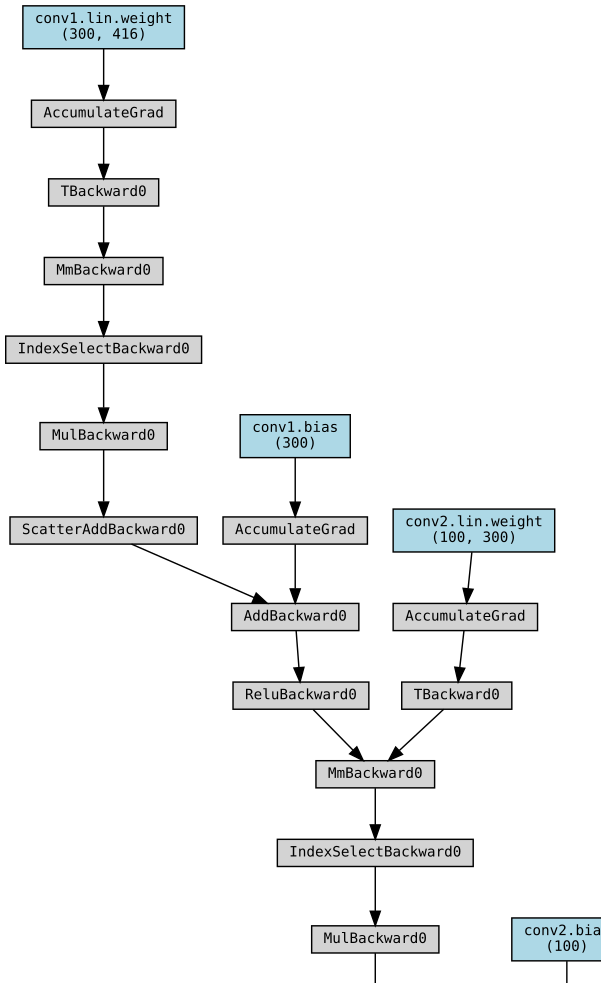

In [12]:
# Create model
in_channels, out_channels = data_list[0].x.shape[1], 16
model = anomaly_anticipation(in_channels,out_channels)

tot_params = 0
for name,param in model.named_parameters():
    print(name,param.shape,param.numel())
    tot_params += param.numel()
print('Total trainable Params:',tot_params)

# Make a forward pass
g = data_list[0]
x = g.x
out = model (x,g.edge_index,g.edge_weight)

# Backtrack to draw the computational graph
make_dot(out, params=dict(list(model.named_parameters())))

# SETUP FUNCTIONS

In [13]:
def compute_labels(data,window_size):
    labels = []
    for i in tqdm(range(len(data))):
        if i+window_size<len(data):
            anomalies = np.stack(data['anomalies'].iloc[i:i+window_size].values)
            labels.append(anomalies.any(axis=0).astype(int))
        else: # Put them to zero when the number of samples is less than the window size, no relevant data come from here
            labels.append(np.zeros(data['anomalies'][0].shape))
    return torch.tensor(labels)

def train_test_split(data,train_split):
  train_size = int(len(data)*train_split)
  train_data = data[:train_size]
  test_data = data[train_size:]

  return train_data, test_data


def train(train_data, logpath, logger_name, num_epochs, initial_lr, batch_size,es_patience, es_min_delta = 0, apply_weight_balancing = False):

  # Create model
  in_channels, out_channels = train_data[0].x.shape[1], 16
  model = anomaly_anticipation(in_channels,out_channels).to(device)

  # Prepare dataloader
  train_loader = DataLoader(train_data, batch_size = batch_size, shuffle = False)

  # Compute weight balancing
  pos_weight = None
  if APPLY_WEIGHT_BALANCING:
    train_labels = torch.cat([g.y for g in train_data])
    train_ones = len(train_labels.nonzero())
    train_zeros = len(train_labels)-train_ones
    pos_weight = torch.tensor(train_zeros/train_ones) * 100
    # pos_weight = torch.tensor(train_ones/train_zeros)


  # Set up training
  criterion = torch.nn.BCEWithLogitsLoss(weight = pos_weight)
  optimizer = torch.optim.Adam([p for p in model.parameters()],lr = initial_lr)
  scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer,T_max=num_epochs,eta_min=initial_lr * 1e-1)
  trainer =  MyTrainer(model,
                       optimizer,
                       scheduler,
                       es_patience,
                       es_min_delta)

  trainer.train(num_epochs,criterion,train_loader,logger_name,device,logpath)
  model.load_state_dict(torch.load(os.path.join(logpath,'BestModel/best-model.pt'))['model'])
  return model

# PLOT FUNCTIONS

In [33]:
def get_predictions(model,dataloader,device):
    model.eval()

    preds = []
    y_true = []
    with torch.no_grad():
        for g in tqdm(dataloader):
            g = g.to(device)

            # Forward pass
            logits = model(g.x,g.edge_index,g.edge_weight).squeeze()

            pred = torch.sigmoid(logits)
            preds.append(pred.detach().cpu().numpy())
            y_true.append(g.y.detach().cpu().numpy())

    preds = np.concatenate(preds).astype(float)
    y_true = np.concatenate(y_true).astype(int)

    return pd.DataFrame({'prob': preds,'true_class': y_true})

def plot_roc_curve(predictions,save_as=None):
    plt.figure(figsize=(10,9))
    plt.rcParams['font.size'] = 15
    fpr,tpr,thr = roc_curve(predictions['true_class'], predictions['prob'], pos_label=None, sample_weight=None, drop_intermediate=True)

    plt.grid()
    plt.plot(fpr,tpr,color='darkorange')
    plt.plot((0,1),(0,1),linestyle='--',color='grey',alpha=0.5)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend([f'Anomaly Detection (AUC={auc(fpr,tpr):.2f})'])

    plt.title("ROC curve")

    if save_as is not None:
      plt.savefig(save_as)
    plt.show()
    return fpr,tpr,thr

def plot_pr_curve(predictions,save_as=None):
    plt.figure(figsize=(10,9))
    plt.rcParams['font.size'] = 15
    prec,rec,thr = precision_recall_curve(predictions['true_class'], predictions['prob'])

    plt.grid()
    plt.plot(prec,rec,color='darkorange')
    plt.plot((0,1),(0,1),linestyle='--',color='grey',alpha=0.5)
    plt.xlabel("Precision")
    plt.ylabel("Recall")

    plt.title("Precision/Recall curve")
    if save_as is not None:
      plt.savefig(save_as)
    plt.show()

def plot_classification_report(predictions, th, save_fig_as=None):
    y_pred = predictions['prob']>th
    y_true = predictions['true_class']

    cm = confusion_matrix(y_true,y_pred)
    disp  = ConfusionMatrixDisplay(cm)
    disp.plot()
    if save_fig_as is not None:
      plt.savefig(save_fig_as)
    plt.show()

    print("\nClassification Report")
    print(classification_report(y_true,y_pred))

def plot_distributions(predictions, th,save_as = None):
    plt.figure(figsize=(10,10))
    plt.yscale('log')
    predictions['prob'].hist(bins = 200,color='black')
    predictions[predictions['true_class']==0]['prob'].hist(bins = 200,color='lime',alpha=0.7,)
    predictions[predictions['true_class']==1]['prob'].hist(bins = 200,color='red',alpha=0.7)
    ylim = plt.gca().get_ylim()

    plt.vlines(th, *ylim,color='blue')
    plt.gca().set_ylim(ylim)
    plt.legend(['Threshold','Global Distrib.','Negative Distrib.','Positive Distrib.'])
    if save_as is not None:
      plt.savefig(save_as)
    plt.show()

## Training Setup

In [15]:
TRAIN_SPLIT = 0.7
NUM_EPOCHS = 200
INITIAL_LR = 1e-3

TRAIN_BATCH_SIZE = 64
TEST_BATCH_SIZE = 64

ES_PATIENCE = 50
ES_MIN_DELTA = 0

APPLY_WEIGHT_BALANCING = True # whether to use weight balancing inside the loss

LOGGER_NAME = f'train.output'
BASE_LOGPATH = f'out'

In [16]:
# Select device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Available device:',device)

if not os.path.exists(BASE_LOGPATH):
  os.makedirs(BASE_LOGPATH)

Available device: cuda


# Window size 4

In [44]:
window_size = 4
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g.y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [45]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT)
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name, NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 2318.983075391438, Train Acc at 50%: 0.9907627387093855


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 567.0803692641869, Train Acc at 50%: 0.9911247624219386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 479.0003167707485, Train Acc at 50%: 0.9911247624219386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 413.7871300570187, Train Acc at 50%: 0.9911247624219386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 322.1303737894832, Train Acc at 50%: 0.9911247624219386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 229.1703547832383, Train Acc at 50%: 0.9911247624219386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 180.12432120553896, Train Acc at 50%: 0.9911247624219386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 168.47709068694, Train Acc at 50%: 0.9916055751651733


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 150.4274934383202, Train Acc at 50%: 0.9968209792741425


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 140.09161462575798, Train Acc at 50%: 0.9967926961715993


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 134.08829984613993, Train Acc at 50%: 0.9967983527921079


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 131.1863856457598, Train Acc at 50%: 0.9967248167254955


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 128.67425785138926, Train Acc at 50%: 0.9966173409358313


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 127.67469906778894, Train Acc at 50%: 0.996526835007693


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 126.83879762874469, Train Acc at 50%: 0.9966173409358313


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 129.38341705131685, Train Acc at 50%: 0.9965890578332881


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 127.76132455425831, Train Acc at 50%: 0.9964646121820979


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 126.43623857362657, Train Acc at 50%: 0.9965607747307449


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 127.511132229161, Train Acc at 50%: 0.996130871572088


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 125.95316318218843, Train Acc at 50%: 0.9962949135668386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 127.77865643949679, Train Acc at 50%: 0.9961478414336139


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 129.7824576884786, Train Acc at 50%: 0.9961025884695448


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 129.34878722056294, Train Acc at 50%: 0.9958480405466558


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 128.9930536700154, Train Acc at 50%: 0.9954860168341026


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 126.07638700334871, Train Acc at 50%: 0.9958536971671644


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 122.19935061996561, Train Acc at 50%: 0.9967926961715993


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 120.10860711376596, Train Acc at 50%: 0.9968040094126165


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 118.86864195854828, Train Acc at 50%: 0.9968492623766857


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 118.18502805683772, Train Acc at 50%: 0.9967248167254955


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 117.66446058466829, Train Acc at 50%: 0.9967587564485474


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 117.29923522490724, Train Acc at 50%: 0.9968379491356684


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 116.38434473708028, Train Acc at 50%: 0.9968662322382116


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 115.99895918182641, Train Acc at 50%: 0.9968153226536338


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 115.74387953660965, Train Acc at 50%: 0.996764413069056


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 115.88020409086795, Train Acc at 50%: 0.9967757263100733


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 115.32378495791474, Train Acc at 50%: 0.9967191601049868


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 114.95447551814644, Train Acc at 50%: 0.9967530998280387


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 114.58725902796633, Train Acc at 50%: 0.9968266358946511


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 114.18700787401575, Train Acc at 50%: 0.9968096660331252


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 114.1730360213594, Train Acc at 50%: 0.9967248167254955


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 113.22076658521134, Train Acc at 50%: 0.9966795637614264


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 113.00197981717803, Train Acc at 50%: 0.9968379491356684


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 112.49188840619061, Train Acc at 50%: 0.9967757263100733


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 112.15724273689926, Train Acc at 50%: 0.9968379491356684


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 112.41037650466106, Train Acc at 50%: 0.996702190243461


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 111.81246040365644, Train Acc at 50%: 0.9966739071409177


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 110.75527197031406, Train Acc at 50%: 0.9967926961715993


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 110.1376934564214, Train Acc at 50%: 0.9968153226536338


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 110.03503710743054, Train Acc at 50%: 0.9968379491356684


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 109.1632840076025, Train Acc at 50%: 0.996702190243461


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 110.15008145533533, Train Acc at 50%: 0.9966908770024436


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 108.47563127884877, Train Acc at 50%: 0.996702190243461


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 107.88862114218482, Train Acc at 50%: 0.9968209792741425


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 107.7664947054032, Train Acc at 50%: 0.9968718888587202


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 107.18928183546022, Train Acc at 50%: 0.9965211783871843


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 108.30259525748937, Train Acc at 50%: 0.9966739071409177


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 111.52776269345642, Train Acc at 50%: 0.9959894560593718


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 106.04459679609015, Train Acc at 50%: 0.9969171418227893


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 107.13898316589737, Train Acc at 50%: 0.9968492623766857


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 106.52040908679518, Train Acc at 50%: 0.9965098651461671


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 105.7444338854195, Train Acc at 50%: 0.9966908770024436


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 106.80723368630645, Train Acc at 50%: 0.9966116843153227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 106.19619422572178, Train Acc at 50%: 0.9966456240383745


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 104.80003846501945, Train Acc at 50%: 0.9967700696895647


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 104.28481084261018, Train Acc at 50%: 0.9966399674178659


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 104.16987962711558, Train Acc at 50%: 0.9966795637614264


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 103.21025658430628, Train Acc at 50%: 0.9968209792741425


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 102.90406371617341, Train Acc at 50%: 0.9968718888587202


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 102.76044212145895, Train Acc at 50%: 0.9965494614897276


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 102.84112815639425, Train Acc at 50%: 0.9967191601049868


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 102.7550343922527, Train Acc at 50%: 0.996685220381935


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 101.76254638428817, Train Acc at 50%: 0.9968832020997376


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 101.08169291338582, Train Acc at 50%: 0.9968888587202461


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 100.69842293420218, Train Acc at 50%: 0.9966795637614264


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 102.71802878088515, Train Acc at 50%: 0.996685220381935


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 101.83525658430628, Train Acc at 50%: 0.9967700696895647


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 100.60638971852656, Train Acc at 50%: 0.996922798443298


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 99.8945040275138, Train Acc at 50%: 0.9968662322382116


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 99.27689157389808, Train Acc at 50%: 0.9968549189971944


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 100.0564756991583, Train Acc at 50%: 0.9967757263100733


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 99.84072087971762, Train Acc at 50%: 0.9968718888587202


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 99.79977826047606, Train Acc at 50%: 0.996922798443298


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 99.49968322925152, Train Acc at 50%: 0.9963741062539596


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 102.52201556701964, Train Acc at 50%: 0.9969510815458412


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 101.0495406824147, Train Acc at 50%: 0.9968209792741425


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 99.59814236582496, Train Acc at 50%: 0.9968718888587202


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 98.20786949045163, Train Acc at 50%: 0.9969341116843153


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 97.89480948502127, Train Acc at 50%: 0.9969171418227893


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 97.95566340845325, Train Acc at 50%: 0.9968605756177029


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 97.9351411892479, Train Acc at 50%: 0.9968492623766857


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 97.58798307539143, Train Acc at 50%: 0.9969058285817721


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 97.04392931487013, Train Acc at 50%: 0.9969001719612635


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 97.2520929495882, Train Acc at 50%: 0.9968549189971944


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 97.03386053036473, Train Acc at 50%: 0.9969058285817721


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 96.66020680604579, Train Acc at 50%: 0.9968662322382116


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 97.03829532084352, Train Acc at 50%: 0.9968549189971944


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 96.65511584758802, Train Acc at 50%: 0.996922798443298


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 96.50104081817359, Train Acc at 50%: 0.9969284550638067


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 96.1929360123088, Train Acc at 50%: 0.996526835007693


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 98.37688931124988, Train Acc at 50%: 0.9967361299665128


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 97.03543307086615, Train Acc at 50%: 0.996939768304824


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 95.5617137297493, Train Acc at 50%: 0.9969341116843153


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 94.85504909946602, Train Acc at 50%: 0.996939768304824


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 95.54435921802879, Train Acc at 50%: 0.9969058285817721


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 95.32959996379763, Train Acc at 50%: 0.9969341116843153


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 94.48088062268079, Train Acc at 50%: 0.9969680514073672


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 94.33799438863245, Train Acc at 50%: 0.996939768304824


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 94.5936510091411, Train Acc at 50%: 0.9969454249253326


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 94.26932867227804, Train Acc at 50%: 0.9969680514073672


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 93.76703208435153, Train Acc at 50%: 0.9969680514073672


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 93.59117340935832, Train Acc at 50%: 0.9969680514073672


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 93.63441261652638, Train Acc at 50%: 0.9969680514073672


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 93.5281416870305, Train Acc at 50%: 0.9969680514073672


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 92.95966829577337, Train Acc at 50%: 0.9969284550638067


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 93.662299755634, Train Acc at 50%: 0.9969341116843153


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 93.6297119648837, Train Acc at 50%: 0.9969623947868586


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 92.91034822155851, Train Acc at 50%: 0.9969737080278758


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 92.35727780794642, Train Acc at 50%: 0.9968888587202461


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 93.58260928590823, Train Acc at 50%: 0.9969567381663499


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 92.58039189066884, Train Acc at 50%: 0.9969737080278758


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 92.20286903792199, Train Acc at 50%: 0.9969680514073672


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 91.73950696895646, Train Acc at 50%: 0.9969906778894018


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 91.849799755634, Train Acc at 50%: 0.9969793646483844


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 91.60731740428999, Train Acc at 50%: 0.9969906778894018


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 91.41112317856819, Train Acc at 50%: 0.9969737080278758


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 91.24466015023984, Train Acc at 50%: 0.9970076477509277


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 91.25085980631731, Train Acc at 50%: 0.9969793646483844


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 90.72581229070504, Train Acc at 50%: 0.9968945153407548


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 91.88157864965156, Train Acc at 50%: 0.9969850212688931


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 91.13340573807585, Train Acc at 50%: 0.9969737080278758


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 90.3570685129876, Train Acc at 50%: 0.9969850212688931


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 90.29422911575708, Train Acc at 50%: 0.9969906778894018


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 90.39876911937732, Train Acc at 50%: 0.9970133043714363


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 89.98002081636348, Train Acc at 50%: 0.9969963345099104


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 89.7335052945968, Train Acc at 50%: 0.9969963345099104


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 89.61100552086161, Train Acc at 50%: 0.9969963345099104


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 89.79892976739977, Train Acc at 50%: 0.9970133043714363


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 89.61815548918455, Train Acc at 50%: 0.9969850212688931


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 89.20099103991312, Train Acc at 50%: 0.9968549189971944


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 89.9697597067608, Train Acc at 50%: 0.9970246176124536


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 89.22407005158838, Train Acc at 50%: 0.9969906778894018


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 88.84754276405104, Train Acc at 50%: 0.9969963345099104


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 88.78296112770387, Train Acc at 50%: 0.9970019911304191


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 88.54968209792742, Train Acc at 50%: 0.9970076477509277


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 88.40176147162639, Train Acc at 50%: 0.9970133043714363


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 88.44845687392524, Train Acc at 50%: 0.9970076477509277


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 88.36370938546474, Train Acc at 50%: 0.9970076477509277


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 87.88788012489817, Train Acc at 50%: 0.9970133043714363


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 87.8728448275862, Train Acc at 50%: 0.9970302742329623


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 87.81664630283284, Train Acc at 50%: 0.997018960991945


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 87.61210856186081, Train Acc at 50%: 0.997018960991945


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 87.49237487555435, Train Acc at 50%: 0.9970076477509277


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 87.29368042356775, Train Acc at 50%: 0.9970302742329623


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 87.70699271427279, Train Acc at 50%: 0.9970472440944882


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 87.96970314055571, Train Acc at 50%: 0.9969906778894018


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 87.26821431803783, Train Acc at 50%: 0.9969454249253326


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 88.08586749932121, Train Acc at 50%: 0.9969793646483844


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 87.14086682052674, Train Acc at 50%: 0.9970019911304191


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 87.15387704769662, Train Acc at 50%: 0.9970585573355055


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 86.78405851208254, Train Acc at 50%: 0.997018960991945


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 86.63410715901891, Train Acc at 50%: 0.9970698705765227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 86.43512987600688, Train Acc at 50%: 0.997018960991945


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 86.4835788306634, Train Acc at 50%: 0.9970585573355055


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 86.1581195130781, Train Acc at 50%: 0.9970133043714363


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 86.33159675083718, Train Acc at 50%: 0.9970585573355055


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 85.94944112589374, Train Acc at 50%: 0.9970076477509277


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 86.10042764051046, Train Acc at 50%: 0.9970698705765227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 85.69311702416508, Train Acc at 50%: 0.997018960991945


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 85.91137206987058, Train Acc at 50%: 0.9970755271970314


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 85.50683319757444, Train Acc at 50%: 0.997018960991945


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 85.66615757082089, Train Acc at 50%: 0.9970755271970314


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 85.21423884514435, Train Acc at 50%: 0.997018960991945


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 85.45545977011494, Train Acc at 50%: 0.9970755271970314


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 85.05780500497782, Train Acc at 50%: 0.9970472440944882


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 85.25277174404924, Train Acc at 50%: 0.9970642139560141


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 84.81898814372342, Train Acc at 50%: 0.9970472440944882


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 85.02499094940718, Train Acc at 50%: 0.9970698705765227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 84.67669019820798, Train Acc at 50%: 0.9970642139560141


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 84.7905127160829, Train Acc at 50%: 0.9970698705765227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 84.51069101276134, Train Acc at 50%: 0.9970642139560141


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 84.5837066702869, Train Acc at 50%: 0.9970698705765227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 84.33574305367002, Train Acc at 50%: 0.9970642139560141


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 84.38465585120825, Train Acc at 50%: 0.9970755271970314


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 84.21634876459409, Train Acc at 50%: 0.9970698705765227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 84.11902095212237, Train Acc at 50%: 0.9970585573355055


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 84.17053579509458, Train Acc at 50%: 0.9970811838175401


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 83.90459543850122, Train Acc at 50%: 0.9970642139560141


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 83.9831715539868, Train Acc at 50%: 0.9970585573355055


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 83.89480948502127, Train Acc at 50%: 0.9970698705765227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 83.61669608109331, Train Acc at 50%: 0.9970415874739795


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 84.063156167979, Train Acc at 50%: 0.9970698705765227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 83.69752918816182, Train Acc at 50%: 0.9970472440944882


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 83.44743302561318, Train Acc at 50%: 0.9971094669200833


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 83.8452857724681, Train Acc at 50%: 0.9970359308534709


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 83.45142659969228, Train Acc at 50%: 0.9970698705765227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 83.30794642049054, Train Acc at 50%: 0.9970529007149969


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 83.47961919630735, Train Acc at 50%: 0.9970359308534709


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 83.17534957914744, Train Acc at 50%: 0.9970529007149969


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 83.27185152502489, Train Acc at 50%: 0.997098153679066


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 83.22873676350801, Train Acc at 50%: 0.9970415874739795


In [46]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

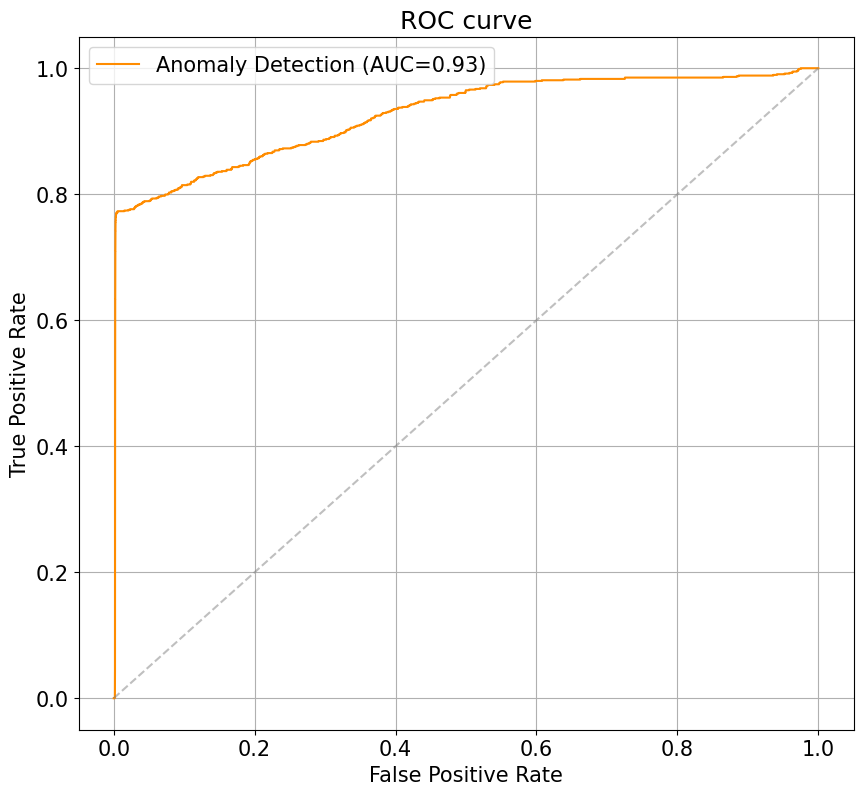


Best probability threshold: p=4.28%


In [47]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

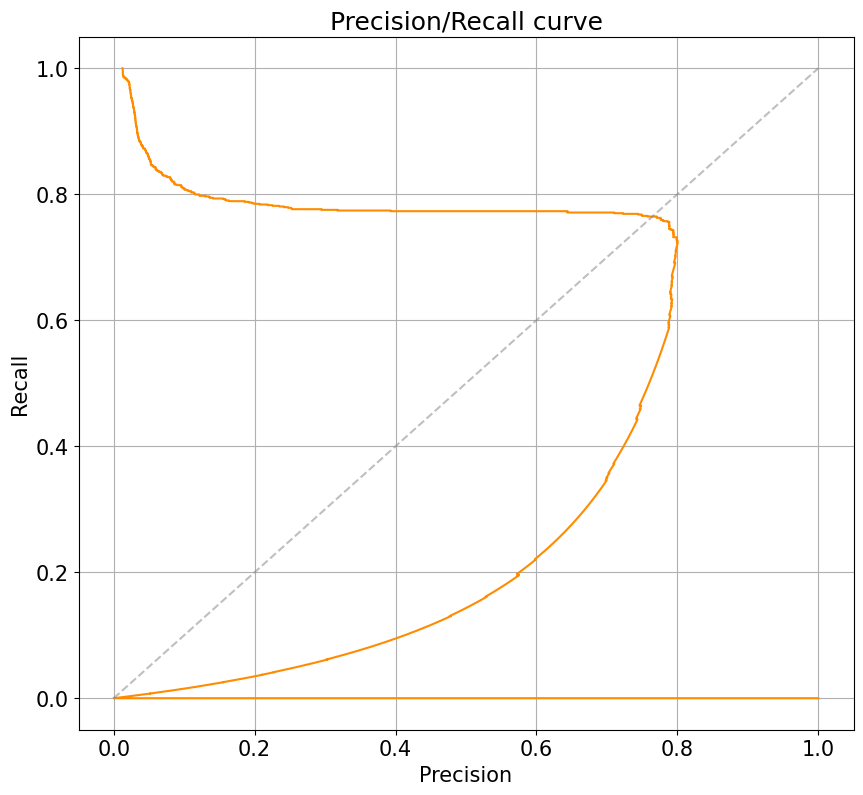

In [48]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

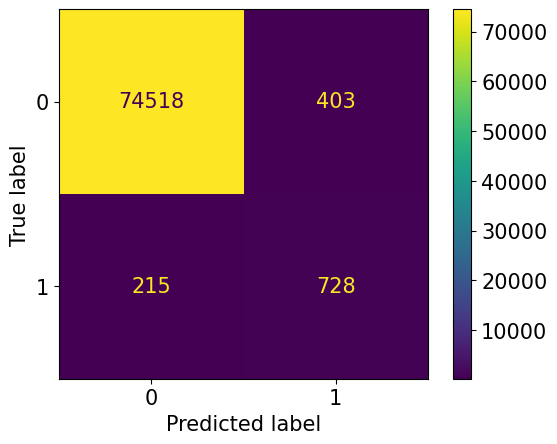


Classification Report
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     74921
           1       0.64      0.77      0.70       943

    accuracy                           0.99     75864
   macro avg       0.82      0.88      0.85     75864
weighted avg       0.99      0.99      0.99     75864



In [49]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

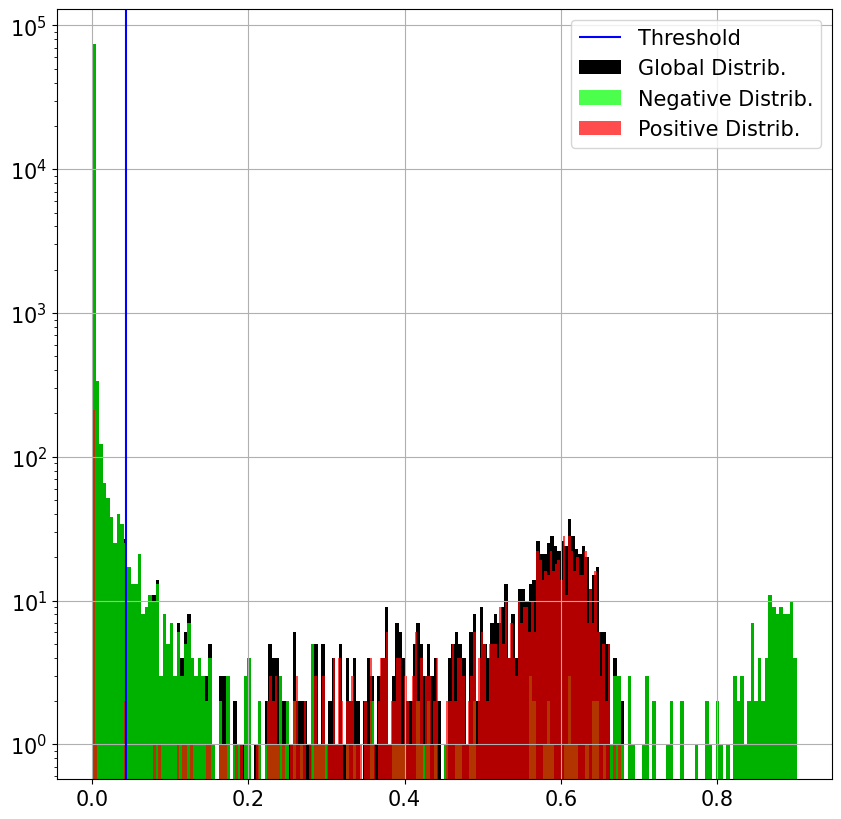

In [50]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

# Window size 24

In [51]:
window_size = 24
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g.y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [52]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT)
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name, NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 1202.5088243279936, Train Acc at 50%: 0.9896370712281655


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 475.29477780794645, Train Acc at 50%: 0.9896370712281655


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 435.54317132772195, Train Acc at 50%: 0.9896370712281655


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 357.3635623133315, Train Acc at 50%: 0.9896370712281655


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 275.06674812200197, Train Acc at 50%: 0.9896370712281655


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 241.801701511449, Train Acc at 50%: 0.993466603312517


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 229.27104262829215, Train Acc at 50%: 0.9944678251425468


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 224.51830482396596, Train Acc at 50%: 0.9947280296859444


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 230.3969363743325, Train Acc at 50%: 0.9945017648655987


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 221.34485021268893, Train Acc at 50%: 0.9948128789935741


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 218.910331251697, Train Acc at 50%: 0.9940662050864332


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 212.37421938636982, Train Acc at 50%: 0.9954124807674902


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 208.53749208073128, Train Acc at 50%: 0.9955652095212236


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 206.65858901258034, Train Acc at 50%: 0.9956048058647842


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 204.77038646031315, Train Acc at 50%: 0.9956161191058014


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 202.5981084261019, Train Acc at 50%: 0.99562177572631


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 200.85064259208977, Train Acc at 50%: 0.9956161191058014


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 200.25855281020907, Train Acc at 50%: 0.9956104624852928


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 200.1683183998552, Train Acc at 50%: 0.9956104624852928


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 198.852746854919, Train Acc at 50%: 0.9956161191058014


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 197.02672187528282, Train Acc at 50%: 0.9955991492442755


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 195.56704226626843, Train Acc at 50%: 0.9956104624852928


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 192.4124355145262, Train Acc at 50%: 0.9955991492442755


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 189.77923341478868, Train Acc at 50%: 0.9953615711829125


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 186.6224545207711, Train Acc at 50%: 0.9953389447008779


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 186.48781563942438, Train Acc at 50%: 0.9953276314598606


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 186.36718255045704, Train Acc at 50%: 0.9953106615983347


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 185.44723504389538, Train Acc at 50%: 0.9953106615983347


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 184.57149968322926, Train Acc at 50%: 0.9953106615983347


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 183.7015001357589, Train Acc at 50%: 0.9953163182188434


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 182.8648520228075, Train Acc at 50%: 0.995384197664947


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 181.16683636528194, Train Acc at 50%: 0.9953332880803692


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 179.37229613539688, Train Acc at 50%: 0.9953728844239298


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 179.14572585754368, Train Acc at 50%: 0.9953502579418952


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 179.19945243913477, Train Acc at 50%: 0.9953276314598606


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 178.61607385283736, Train Acc at 50%: 0.9953785410444385


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 177.04564892750474, Train Acc at 50%: 0.9953728844239298


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 175.48939949316681, Train Acc at 50%: 0.9954351072495249


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 175.62188885872024, Train Acc at 50%: 0.9953332880803692


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 175.38974115304552, Train Acc at 50%: 0.9953785410444385


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 175.8605416779799, Train Acc at 50%: 0.9953332880803692


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 175.04963118834283, Train Acc at 50%: 0.9953955109059643


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 172.8953525205901, Train Acc at 50%: 0.9953955109059643


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 171.80436012308806, Train Acc at 50%: 0.9954068241469817


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 171.96437460403658, Train Acc at 50%: 0.9953615711829125


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 169.9289867861345, Train Acc at 50%: 0.995384197664947


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 171.17965426735452, Train Acc at 50%: 0.9954464204905421


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 170.6675943524301, Train Acc at 50%: 0.995384197664947


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 169.07647750927686, Train Acc at 50%: 0.9953672278034211


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 169.6429201737714, Train Acc at 50%: 0.9953389447008779


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 168.46273418408904, Train Acc at 50%: 0.9953389447008779


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 168.10763417503847, Train Acc at 50%: 0.9953389447008779


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 167.4252647298398, Train Acc at 50%: 0.9953728844239298


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 165.65172187528282, Train Acc at 50%: 0.9953559145624038


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 165.71291519594533, Train Acc at 50%: 0.9953389447008779


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 166.42842112408363, Train Acc at 50%: 0.9953955109059643


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 163.6941691555797, Train Acc at 50%: 0.9952088424291791


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 164.50371074305366, Train Acc at 50%: 0.9953446013213866


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 164.81248303013848, Train Acc at 50%: 0.9953672278034211


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 162.5139379129333, Train Acc at 50%: 0.9953615711829125


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 161.6630351163001, Train Acc at 50%: 0.9953615711829125


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 161.25920897818807, Train Acc at 50%: 0.9953446013213866


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 161.76735451172053, Train Acc at 50%: 0.9953389447008779


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 160.46998597158114, Train Acc at 50%: 0.995384197664947


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 160.33610507738257, Train Acc at 50%: 0.995305004977826


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 159.37743234681872, Train Acc at 50%: 0.9953446013213866


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 160.0897931939542, Train Acc at 50%: 0.9953728844239298


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 159.20513168612544, Train Acc at 50%: 0.9953502579418952


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 157.65750294144266, Train Acc at 50%: 0.994988234229342


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 157.5408408000724, Train Acc at 50%: 0.995384197664947


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 157.50927685763418, Train Acc at 50%: 0.9953728844239298


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 156.98812109693185, Train Acc at 50%: 0.9951692460856186


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 157.03180152049958, Train Acc at 50%: 0.9953955109059643


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 156.12462666304643, Train Acc at 50%: 0.9954294506290162


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 155.0742714272785, Train Acc at 50%: 0.9953955109059643


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 152.4697144537967, Train Acc at 50%: 0.9950900533984977


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 152.97370802787583, Train Acc at 50%: 0.9954181373879989


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 153.07644356955382, Train Acc at 50%: 0.995401167526473


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 151.6166734546113, Train Acc at 50%: 0.9954068241469817


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 150.69484795004072, Train Acc at 50%: 0.9952201556701964


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 150.6597542764051, Train Acc at 50%: 0.995401167526473


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 150.84023441035387, Train Acc at 50%: 0.9954181373879989


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 148.42549099466015, Train Acc at 50%: 0.9952880351163002


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 146.5657073038284, Train Acc at 50%: 0.9951409629830754


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 148.33070866141733, Train Acc at 50%: 0.9954464204905421


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 147.89847497511087, Train Acc at 50%: 0.9954577337315594


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 146.7921531360304, Train Acc at 50%: 0.9954351072495249


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 146.01409629830755, Train Acc at 50%: 0.9953898542854557


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 146.2079939361028, Train Acc at 50%: 0.9954351072495249


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 143.71573219295863, Train Acc at 50%: 0.9951805593266358


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 144.8457439587293, Train Acc at 50%: 0.9955086433161372


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 143.7645262014662, Train Acc at 50%: 0.9954351072495249


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 141.5839781880713, Train Acc at 50%: 0.9952597520137569


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 141.1500701420943, Train Acc at 50%: 0.9954124807674902


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 139.8997420581048, Train Acc at 50%: 0.9952484387727396


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 140.12876730925876, Train Acc at 50%: 0.9955482396596977


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 139.51411892478959, Train Acc at 50%: 0.9953446013213866


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 137.23274730744865, Train Acc at 50%: 0.9953559145624038


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 138.73659380939452, Train Acc at 50%: 0.9958423839261472


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 138.93626120010862, Train Acc at 50%: 0.9954860168341026


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 135.23669562856367, Train Acc at 50%: 0.9954181373879989


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 136.07863833831115, Train Acc at 50%: 0.9957122816544484


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 136.1458050502308, Train Acc at 50%: 0.995480360213594


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 133.35233957824238, Train Acc at 50%: 0.995559552900715


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 133.96828898542856, Train Acc at 50%: 0.9955369264186804


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 131.68832020997377, Train Acc at 50%: 0.9954973300751199


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 131.11240836274777, Train Acc at 50%: 0.995384197664947


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 131.35211331342202, Train Acc at 50%: 0.995559552900715


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 130.037311068875, Train Acc at 50%: 0.9954068241469817


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 130.046463480858, Train Acc at 50%: 0.9956500588288533


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 131.14534120734908, Train Acc at 50%: 0.9954181373879989


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 129.7393316137207, Train Acc at 50%: 0.9956783419313965


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 128.57586659426192, Train Acc at 50%: 0.995638745587836


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 126.79268485835823, Train Acc at 50%: 0.995576522762241


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 126.65836274775998, Train Acc at 50%: 0.9955482396596977


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 125.05421305095484, Train Acc at 50%: 0.995576522762241


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 125.76568015204995, Train Acc at 50%: 0.9956104624852928


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 125.37607475789665, Train Acc at 50%: 0.9956613720698706


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 124.69325278305729, Train Acc at 50%: 0.9955934926237668


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 125.1893949678704, Train Acc at 50%: 0.9956557154493619


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 123.67194995022174, Train Acc at 50%: 0.9957066250339397


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 122.62249977373519, Train Acc at 50%: 0.9955878360032582


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 122.43864829396325, Train Acc at 50%: 0.9956613720698706


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 122.39432301565752, Train Acc at 50%: 0.995717938274957


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 121.29704045614987, Train Acc at 50%: 0.995700968413431


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 120.66539958367274, Train Acc at 50%: 0.9956444022083446


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 119.9369739342927, Train Acc at 50%: 0.9957801611005521


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 120.65626979817178, Train Acc at 50%: 0.9956557154493619


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 120.82573083536971, Train Acc at 50%: 0.9957292515159742


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 120.21798352792108, Train Acc at 50%: 0.9957801611005521


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 119.75743279934835, Train Acc at 50%: 0.9957462213775002


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 118.42438229704045, Train Acc at 50%: 0.9957518779980089


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 117.6216625938999, Train Acc at 50%: 0.9956896551724138


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 117.52329396325459, Train Acc at 50%: 0.9957801611005521


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 117.11722780342113, Train Acc at 50%: 0.9957292515159742


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 116.8373042809304, Train Acc at 50%: 0.9957801611005521


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 116.17726717349987, Train Acc at 50%: 0.9957688478595348


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 116.21057335505476, Train Acc at 50%: 0.9958876368902163


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 116.37407231423659, Train Acc at 50%: 0.9957235948954657


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 116.0321296044891, Train Acc at 50%: 0.9958480405466558


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 115.01545388722961, Train Acc at 50%: 0.9957122816544484


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 114.32704317132772, Train Acc at 50%: 0.9958819802697076


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 114.03705086433162, Train Acc at 50%: 0.9959555163363201


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 114.87714951579328, Train Acc at 50%: 0.9956104624852928


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 114.42596615078287, Train Acc at 50%: 0.9959498597158114


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 113.87901620056114, Train Acc at 50%: 0.9959215766132682


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 113.22921757625124, Train Acc at 50%: 0.9958706670286904


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 112.66787718345552, Train Acc at 50%: 0.9958367273056385


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 112.19670332156757, Train Acc at 50%: 0.9958084442030953


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 111.49314417594353, Train Acc at 50%: 0.9957745044800435


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 111.30812743234682, Train Acc at 50%: 0.9959102633722509


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 110.94930536700154, Train Acc at 50%: 0.9957631912390261


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 110.5928703955109, Train Acc at 50%: 0.9960064259208978


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 110.82422617431442, Train Acc at 50%: 0.9957235948954657


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 110.84150149334782, Train Acc at 50%: 0.9960912752285275


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 110.332462213775, Train Acc at 50%: 0.9956613720698706


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 108.82020997375328, Train Acc at 50%: 0.9959555163363201


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 108.95489410806408, Train Acc at 50%: 0.9957518779980089


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 109.07037967236855, Train Acc at 50%: 0.9960799619875101


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 109.4954860168341, Train Acc at 50%: 0.9957914743415693


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 109.03192596615078, Train Acc at 50%: 0.9960969318490361


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 108.80828581772106, Train Acc at 50%: 0.9956839985519051


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 107.74615349805413, Train Acc at 50%: 0.9959611729568286


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 107.48209113946963, Train Acc at 50%: 0.9957801611005521


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 106.89097429631641, Train Acc at 50%: 0.9959781428183546


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 107.0810254321658, Train Acc at 50%: 0.9959668295773373


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 106.83891076115485, Train Acc at 50%: 0.995893293510725


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 106.1905149787311, Train Acc at 50%: 0.9960064259208978


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 106.13284007602498, Train Acc at 50%: 0.9957462213775002


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 105.6403068150964, Train Acc at 50%: 0.9960290524029324


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 105.78489003529731, Train Acc at 50%: 0.9958197574441126


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 105.64143813919812, Train Acc at 50%: 0.9960912752285275


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 105.92260611820075, Train Acc at 50%: 0.9957575346185175


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 105.55483527921079, Train Acc at 50%: 0.9960233957824237


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 104.48055253869128, Train Acc at 50%: 0.9959046067517422


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 104.59086795185084, Train Acc at 50%: 0.9959442030953027


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 104.48168386279302, Train Acc at 50%: 0.9959442030953027


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 104.24632319666938, Train Acc at 50%: 0.9960233957824237


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 103.97082315141641, Train Acc at 50%: 0.9958254140646212


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 103.72149063263643, Train Acc at 50%: 0.9960233957824237


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 103.68838808941986, Train Acc at 50%: 0.9958593537876731


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 103.33044845687392, Train Acc at 50%: 0.9960120825414065


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 103.44975789664223, Train Acc at 50%: 0.9959046067517422


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 103.10120825414064, Train Acc at 50%: 0.9960064259208978


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 103.04470992850031, Train Acc at 50%: 0.9959215766132682


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 102.753269526654, Train Acc at 50%: 0.9960007693003892


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 102.50685582405647, Train Acc at 50%: 0.9959442030953027


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 102.50079192687122, Train Acc at 50%: 0.9959894560593718


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 102.33316363471808, Train Acc at 50%: 0.9959498597158114


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 102.17525341659879, Train Acc at 50%: 0.9959951126798805


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 101.98396913747851, Train Acc at 50%: 0.9959498597158114


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 101.80796904697257, Train Acc at 50%: 0.9959951126798805


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 101.61959227079373, Train Acc at 50%: 0.9959555163363201


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 101.5346185175129, Train Acc at 50%: 0.9959894560593718


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 101.49890261562132, Train Acc at 50%: 0.995972486197846


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 101.4043239207168, Train Acc at 50%: 0.9959837994388633


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 101.21077699339307, Train Acc at 50%: 0.9959668295773373


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 101.00122183002986, Train Acc at 50%: 0.995972486197846


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 100.91986831387456, Train Acc at 50%: 0.9959555163363201


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 100.76896099194498, Train Acc at 50%: 0.995972486197846


In [53]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

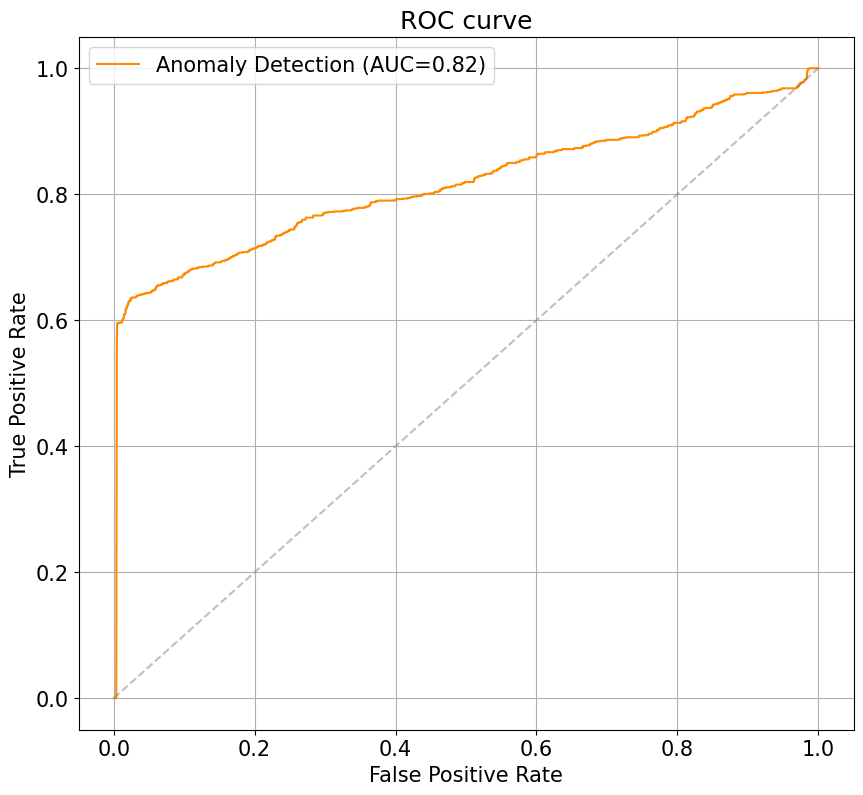


Best probability threshold: p=0.17%


In [54]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")


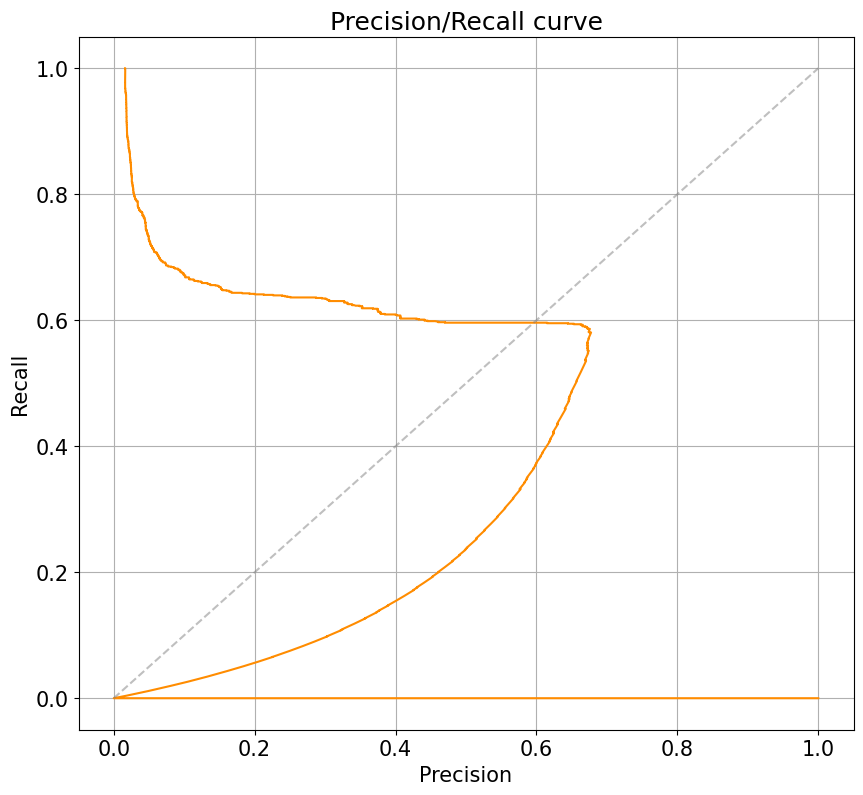

In [55]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

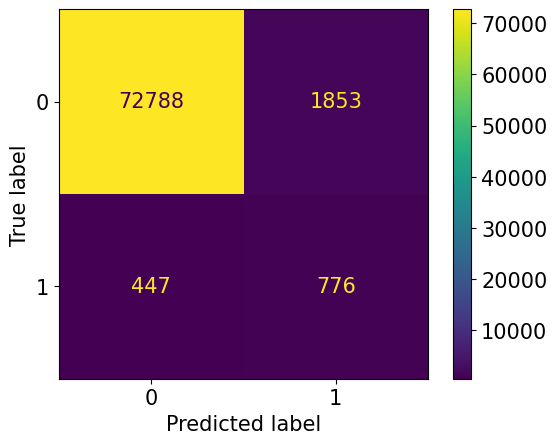


Classification Report
              precision    recall  f1-score   support

           0       0.99      0.98      0.98     74641
           1       0.30      0.63      0.40      1223

    accuracy                           0.97     75864
   macro avg       0.64      0.80      0.69     75864
weighted avg       0.98      0.97      0.98     75864



In [56]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

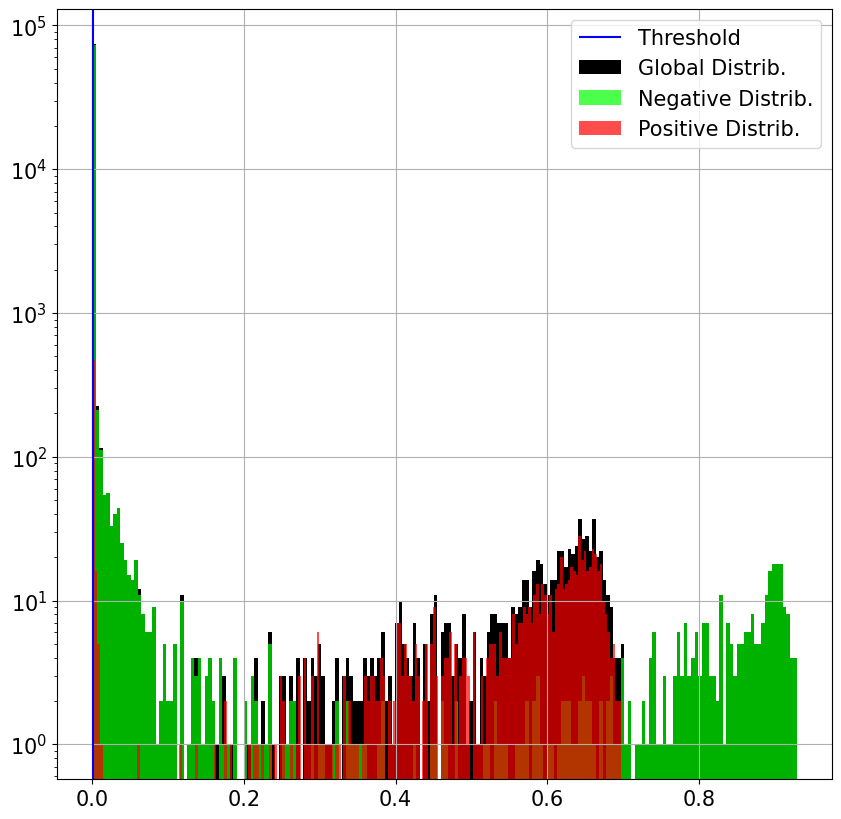

In [57]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

# Window size 64

In [58]:
window_size = 64
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g.y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [59]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT)
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name, NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 2331.8090324916284, Train Acc at 50%: 0.9865598696714635


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 594.9865146167074, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 469.7181192868133, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 461.8412526020454, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 437.97416055751654, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 412.3242827405195, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 384.84098108426105, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 362.10734003077204, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 346.2321250791927, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 335.25690107702053, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 328.2089555615893, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 321.6739071409177, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 315.7953887229614, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 310.94205357950943, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 305.7751380215404, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 300.6024979636166, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 297.05930400941264, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 293.0751877998009, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 290.407751832745, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 288.22784867408814, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 286.46820979274145, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 284.2917006063897, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 282.72332337768125, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 280.4717847769029, Train Acc at 50%: 0.9869218933840167


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 276.5696216852204, Train Acc at 50%: 0.989105348900353


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 272.08550547560867, Train Acc at 50%: 0.9925106344465563


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 268.64361028147346, Train Acc at 50%: 0.9929235677436872


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 267.878903068151, Train Acc at 50%: 0.9930197302923341


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 268.9584577789845, Train Acc at 50%: 0.9930423567743687


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 270.10349352882616, Train Acc at 50%: 0.9929631640872477


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 264.48431984795, Train Acc at 50%: 0.9929292243641958


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 258.38474070051586, Train Acc at 50%: 0.993053670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 257.8002081636347, Train Acc at 50%: 0.9930593266358947


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 256.80321748574534, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 256.3757806136302, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 254.68239207168068, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 253.9331839985519, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 251.34772377590733, Train Acc at 50%: 0.9930593266358947


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 250.95721332247263, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 249.7232328717531, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 249.22934202190243, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 248.543193954204, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 248.89021630916824, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 248.3356638609829, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 246.0036654900896, Train Acc at 50%: 0.9930593266358947


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 245.343583129695, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 243.5727667662232, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 243.85713639243372, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 242.02151778441487, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 242.70841252602045, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 240.6899945696443, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 241.62799800886958, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 240.4591591999276, Train Acc at 50%: 0.9930593266358947


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 239.52796633179474, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 238.2837587111956, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 238.56654448366368, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 236.63347361752196, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 236.99309892297944, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 235.22913838356413, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 235.97470359308534, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 234.76122273508915, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 234.14356502850936, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 233.18938365462938, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 233.60987419675988, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 232.18372703412072, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 231.17501583853743, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 230.48289437958186, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 230.63050954837541, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 230.47800705946239, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 227.80973391257126, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 228.76855371526835, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 226.51613268169066, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 230.51685672911574, Train Acc at 50%: 0.9930762964974206


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 227.11770295954386, Train Acc at 50%: 0.9930762964974206


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 226.3698298488551, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 225.59747488460494, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 223.87279391800163, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 224.89962892569463, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 221.34896823241922, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 223.11566657616075, Train Acc at 50%: 0.9930762964974206


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 221.68499411711468, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 221.3429948411621, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 218.6310299574622, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 220.59030228979998, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 218.5756629559236, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 217.68689474160558, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 217.4498144628473, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 216.54500407276677, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 215.65829486831387, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 214.12464928952846, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 215.5532174857453, Train Acc at 50%: 0.9930762964974206


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 217.26117748212508, Train Acc at 50%: 0.9930932663589465


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 217.1009141098742, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 213.89277310163817, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 211.58077654086344, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 212.7971988415241, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 210.33392162186624, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 209.85844872839172, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 209.9844103538782, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 206.47239569191782, Train Acc at 50%: 0.9930649832564032


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 219.7170784686397, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 222.19508552810208, Train Acc at 50%: 0.9922334600416327


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 219.75147072133225, Train Acc at 50%: 0.9920694180468821


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 217.20119467825143, Train Acc at 50%: 0.9929914471897909


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 217.6333152321477, Train Acc at 50%: 0.992957507466739


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 207.27129151959454, Train Acc at 50%: 0.9930932663589465


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 206.08367273056385, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 203.60012218300298, Train Acc at 50%: 0.9930762964974206


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 203.2808851479772, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 200.21945424925332, Train Acc at 50%: 0.9930762964974206


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 200.47660421757624, Train Acc at 50%: 0.9930819531179292


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 198.200923160467, Train Acc at 50%: 0.9930762964974206


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 199.12910670648927, Train Acc at 50%: 0.9930819531179292


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 197.00108607113765, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 196.22698886777084, Train Acc at 50%: 0.9930876097384379


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 194.68189428907593, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 192.95685129876006, Train Acc at 50%: 0.9930819531179292


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 193.88693546927323, Train Acc at 50%: 0.9930932663589465


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 192.87974024798623, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 190.49300841705133, Train Acc at 50%: 0.9930819531179292


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 190.10186442211966, Train Acc at 50%: 0.9930876097384379


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 190.3325187799801, Train Acc at 50%: 0.9930932663589465


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 189.12489818083085, Train Acc at 50%: 0.9930819531179292


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 188.42194995022174, Train Acc at 50%: 0.9930932663589465


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 186.99720562946874, Train Acc at 50%: 0.9930932663589465


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 187.2461421848131, Train Acc at 50%: 0.9930932663589465


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 184.96723685401395, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 183.66939315775184, Train Acc at 50%: 0.9930989229794551


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 184.09490677889403, Train Acc at 50%: 0.9931045795999638


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 182.55847814281836, Train Acc at 50%: 0.9930762964974206


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 180.06408951036292, Train Acc at 50%: 0.9931045795999638


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 180.78313648293963, Train Acc at 50%: 0.9930989229794551


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 181.43798081274323, Train Acc at 50%: 0.9931102362204725


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 179.41900850755724, Train Acc at 50%: 0.9930819531179292


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 177.37479636166168, Train Acc at 50%: 0.9930989229794551


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 176.51142637342747, Train Acc at 50%: 0.9931045795999638


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 177.09741831839986, Train Acc at 50%: 0.9930989229794551


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 175.82980360213594, Train Acc at 50%: 0.9931102362204725


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 174.2317404289981, Train Acc at 50%: 0.9931102362204725


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 173.90794415784234, Train Acc at 50%: 0.9931158928409811


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 173.71665987872206, Train Acc at 50%: 0.9931158928409811


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 172.11020228074938, Train Acc at 50%: 0.9931102362204725


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 171.84170513168613, Train Acc at 50%: 0.9931158928409811


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 170.32935107249526, Train Acc at 50%: 0.9931158928409811


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 171.34060774730744, Train Acc at 50%: 0.9931158928409811


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 169.4209430717712, Train Acc at 50%: 0.9930989229794551


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 169.48852837360846, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 168.5227848674088, Train Acc at 50%: 0.9931045795999638


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 166.9956783419314, Train Acc at 50%: 0.9931158928409811


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 167.46620734908137, Train Acc at 50%: 0.9931158928409811


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 166.68529957462215, Train Acc at 50%: 0.9930989229794551


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 165.24098334690922, Train Acc at 50%: 0.9931272060819983


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 166.32301565752556, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 164.7470472440945, Train Acc at 50%: 0.9930876097384379


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 163.63289664223007, Train Acc at 50%: 0.9931272060819983


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 163.984297221468, Train Acc at 50%: 0.9930989229794551


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 162.6382817449543, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 162.69042447280296, Train Acc at 50%: 0.9931045795999638


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 161.5070028961897, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 161.42497058557336, Train Acc at 50%: 0.9931102362204725


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 161.2951511449, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 160.5363268169065, Train Acc at 50%: 0.9931045795999638


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 159.41530907774458, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 159.76759208978189, Train Acc at 50%: 0.9931045795999638


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 158.96633179473255, Train Acc at 50%: 0.9931102362204725


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 158.68851253507106, Train Acc at 50%: 0.9931158928409811


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 158.15002488913024, Train Acc at 50%: 0.9931102362204725


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 157.6072608380849, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 157.38143723413884, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 156.85232826500135, Train Acc at 50%: 0.9931102362204725


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 156.61728436962622, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 156.11442211964885, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 155.8987464928953, Train Acc at 50%: 0.9931158928409811


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 155.61346049416235, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 155.2849466015024, Train Acc at 50%: 0.9931158928409811


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 154.76213910761155, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 154.50201375690108, Train Acc at 50%: 0.9931158928409811


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 154.12339351977553, Train Acc at 50%: 0.9931272060819983


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 153.9525522671735, Train Acc at 50%: 0.9931158928409811


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 153.48040546655807, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 153.38371119558332, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 152.9117227803421, Train Acc at 50%: 0.9931272060819983


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 152.85232826500135, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 152.33686306453072, Train Acc at 50%: 0.9931272060819983


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 152.22909313060006, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 151.88458231514164, Train Acc at 50%: 0.9931272060819983


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 151.72321024527108, Train Acc at 50%: 0.9931215494614897


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 151.3927957281202, Train Acc at 50%: 0.9931272060819983


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 151.3075278305729, Train Acc at 50%: 0.9931272060819983


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 150.9469295863879, Train Acc at 50%: 0.9931272060819983


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 150.808240564757, Train Acc at 50%: 0.993132862702507


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 150.5695651190153, Train Acc at 50%: 0.9931272060819983


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 150.43479047877636, Train Acc at 50%: 0.993132862702507


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 150.13392614716264, Train Acc at 50%: 0.993132862702507


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 150.1154289980994, Train Acc at 50%: 0.993132862702507


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 149.7573422934202, Train Acc at 50%: 0.9931272060819983


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 149.7570707756358, Train Acc at 50%: 0.9931272060819983


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 149.3562087066703, Train Acc at 50%: 0.9931272060819983


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 149.38165218571817, Train Acc at 50%: 0.9931272060819983


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 149.037311068875, Train Acc at 50%: 0.9931272060819983


In [60]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

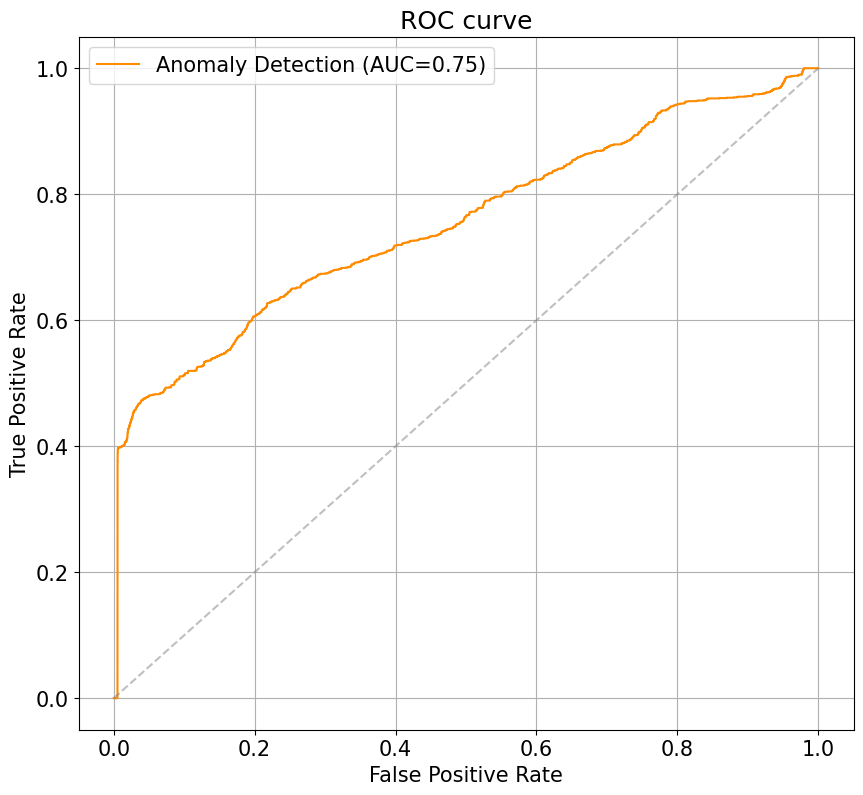


Best probability threshold: p=1.16%


In [61]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

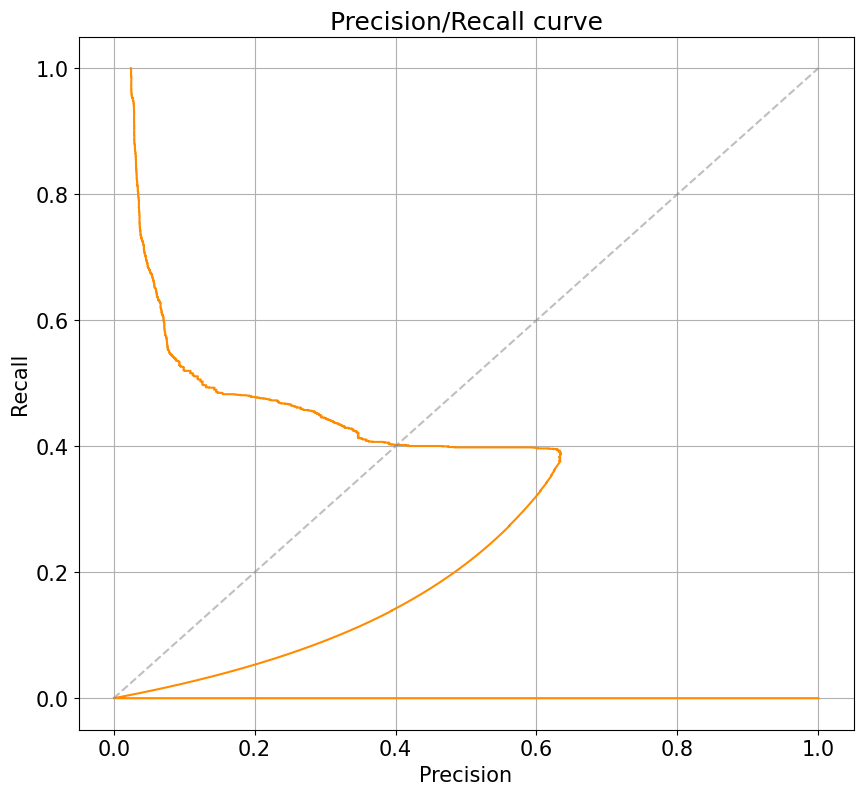

In [62]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

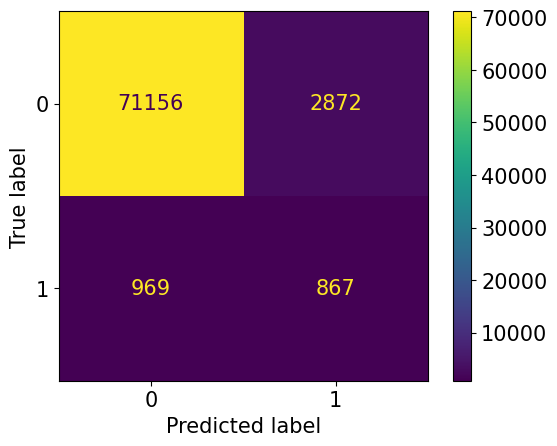


Classification Report
              precision    recall  f1-score   support

           0       0.99      0.96      0.97     74028
           1       0.23      0.47      0.31      1836

    accuracy                           0.95     75864
   macro avg       0.61      0.72      0.64     75864
weighted avg       0.97      0.95      0.96     75864



In [63]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

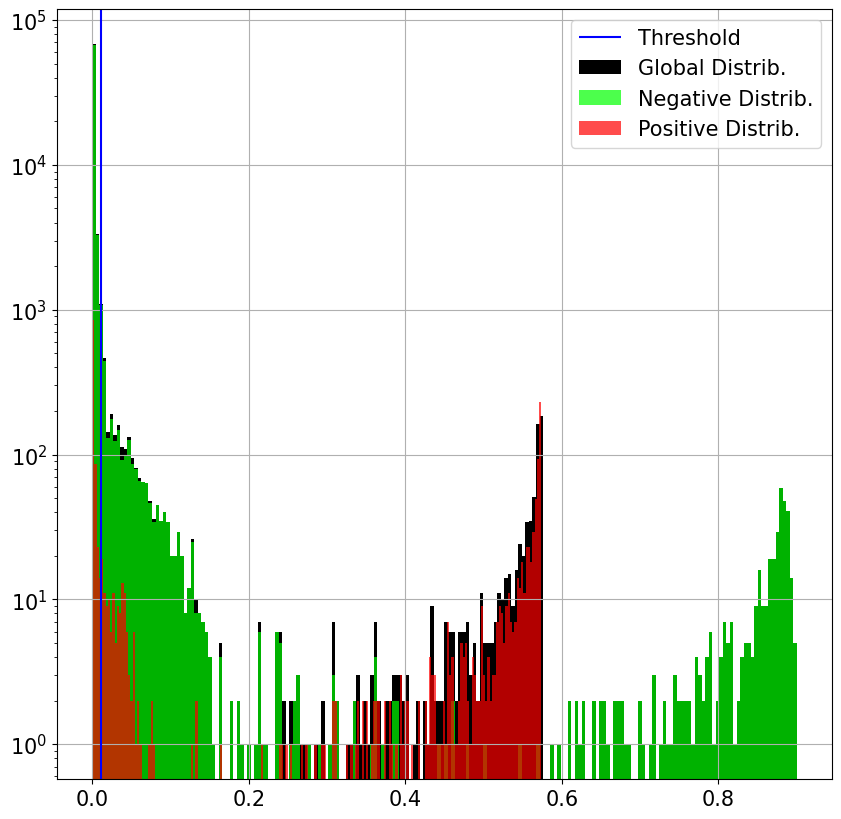

In [64]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

# Window size 192

In [65]:
window_size = 192
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g.y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [66]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT)
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name, NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 790.3137840528555, Train Acc at 50%: 0.9776337225088243


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 490.0259299484116, Train Acc at 50%: 0.977639379129333


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 522.5873834736175, Train Acc at 50%: 0.977639379129333


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 501.33098017920173, Train Acc at 50%: 0.977639379129333


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 482.27201556701965, Train Acc at 50%: 0.977639379129333


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 470.6349895918183, Train Acc at 50%: 0.977639379129333


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 460.5309530274233, Train Acc at 50%: 0.977639379129333


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 451.193049144719, Train Acc at 50%: 0.977639379129333


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 434.9297221468006, Train Acc at 50%: 0.977639379129333


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 437.0483754185899, Train Acc at 50%: 0.977639379129333


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 422.7404289980994, Train Acc at 50%: 0.9814123450085981


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 407.1434066431351, Train Acc at 50%: 0.9817743687211512


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 399.4871481582044, Train Acc at 50%: 0.9824701330437143


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 392.9080912299756, Train Acc at 50%: 0.9827246809666033


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 391.4986424110779, Train Acc at 50%: 0.9843141913295321


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 383.6065707303828, Train Acc at 50%: 0.9843198479500407


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 378.1545162458141, Train Acc at 50%: 0.9843198479500407


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 376.58688569101275, Train Acc at 50%: 0.9843255045705493


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 373.91476604217576, Train Acc at 50%: 0.9843255045705493


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 371.9270974748846, Train Acc at 50%: 0.9843255045705493


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 369.55835369716715, Train Acc at 50%: 0.984331161191058


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 367.97384378676804, Train Acc at 50%: 0.9843424744320753


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 369.2980133948774, Train Acc at 50%: 0.9843651009141099


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 374.64838446918276, Train Acc at 50%: 0.9843368178115667


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 371.5087564485474, Train Acc at 50%: 0.984331161191058


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 363.9153317042266, Train Acc at 50%: 0.9843368178115667


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 360.0090505928138, Train Acc at 50%: 0.9843368178115667


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 358.3929993664585, Train Acc at 50%: 0.9843368178115667


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 357.4640465200471, Train Acc at 50%: 0.9843368178115667


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 356.2651144899991, Train Acc at 50%: 0.984331161191058


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 355.0259752013757, Train Acc at 50%: 0.9843198479500407


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 353.8503710743054, Train Acc at 50%: 0.9843255045705493


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 352.8232419223459, Train Acc at 50%: 0.9843255045705493


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 351.755249343832, Train Acc at 50%: 0.9843085347090235


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 350.57340030772014, Train Acc at 50%: 0.9843255045705493


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 349.40073762331434, Train Acc at 50%: 0.9843198479500407


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 348.1808308444203, Train Acc at 50%: 0.9843424744320753


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 347.11261200108606, Train Acc at 50%: 0.9843537876730926


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 345.65788759163723, Train Acc at 50%: 0.9843651009141099


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 344.35138926599694, Train Acc at 50%: 0.9843820707756358


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 345.5366096479319, Train Acc at 50%: 0.9844725767037741


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 345.003303466377, Train Acc at 50%: 0.9844046972576703


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 341.96692008326545, Train Acc at 50%: 0.9843764141551271


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 340.41175672006517, Train Acc at 50%: 0.9843933840166531


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 339.5351389265997, Train Acc at 50%: 0.9844499502217395


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 338.86973934292695, Train Acc at 50%: 0.9844499502217395


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 339.4049687754548, Train Acc at 50%: 0.9844669200832654


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 338.3988143723414, Train Acc at 50%: 0.9844499502217395


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 336.67614716263915, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 335.9228436962621, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 335.0884242917911, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 334.073965969771, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 333.1648339216219, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 332.4789347452258, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 333.44728029685945, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 333.928658702145, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 329.3657118291248, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 328.90820436238573, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 328.6947461308716, Train Acc at 50%: 0.9844556068422482


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 327.8189881437234, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 326.55977916553536, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 326.15159742963164, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 325.2995519956557, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 325.0411123178568, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 324.8826816906507, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 329.5168567291158, Train Acc at 50%: 0.9844556068422482


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 322.6972576703774, Train Acc at 50%: 0.984427323739705


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 322.24857453163185, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 321.2233007511992, Train Acc at 50%: 0.9843877273961444


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 320.83408000724046, Train Acc at 50%: 0.9844216671191963


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 320.1376368902163, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 319.5075798714816, Train Acc at 50%: 0.9844386369807222


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 318.8059326635895, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 318.3045750746674, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 317.6843153226536, Train Acc at 50%: 0.9844160104986877


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 316.34828943795816, Train Acc at 50%: 0.9843820707756358


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 316.51638157299305, Train Acc at 50%: 0.984427323739705


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 316.15073762331434, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 315.19015295501856, Train Acc at 50%: 0.9843141913295321


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 314.7066024074577, Train Acc at 50%: 0.9844442936012309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 313.58355959815367, Train Acc at 50%: 0.9843820707756358


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 313.84055118110234, Train Acc at 50%: 0.984427323739705


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 312.8223142365825, Train Acc at 50%: 0.9844386369807222


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 312.3261833650104, Train Acc at 50%: 0.9844046972576703


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 311.91573898090326, Train Acc at 50%: 0.984331161191058


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 311.4984840257037, Train Acc at 50%: 0.9844386369807222


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 310.2973346004163, Train Acc at 50%: 0.9842689383654629


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 310.3160467010589, Train Acc at 50%: 0.9844160104986877


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 311.0290750294144, Train Acc at 50%: 0.9843085347090235


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 308.37949135668384, Train Acc at 50%: 0.9843085347090235


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 308.2026880260657, Train Acc at 50%: 0.984331161191058


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 307.0437143632908, Train Acc at 50%: 0.9841784324373246


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 306.7827857724681, Train Acc at 50%: 0.9842123721603765


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 306.313489908589, Train Acc at 50%: 0.9843594442936012


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 305.51554439315777, Train Acc at 50%: 0.9842745949859716


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 306.26244456511904, Train Acc at 50%: 0.9843707575346186


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 304.1102135939904, Train Acc at 50%: 0.984110552991221


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 304.66456240383746, Train Acc at 50%: 0.9842689383654629


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 302.8141913295321, Train Acc at 50%: 0.9841614625757987


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 303.5278758258666, Train Acc at 50%: 0.9843141913295321


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 301.6854918997194, Train Acc at 50%: 0.9841388360937642


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 302.02796633179474, Train Acc at 50%: 0.9843255045705493


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 300.20716806950855, Train Acc at 50%: 0.9841444927142727


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 301.9134989591818, Train Acc at 50%: 0.9843820707756358


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 299.3394651099647, Train Acc at 50%: 0.9840483301656259


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 299.7305638519323, Train Acc at 50%: 0.9842802516064802


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 297.8681554891845, Train Acc at 50%: 0.9842180287808852


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 298.7018508462304, Train Acc at 50%: 0.9843198479500407


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 297.39514888225176, Train Acc at 50%: 0.9843198479500407


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 297.3105258394425, Train Acc at 50%: 0.9843368178115667


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 296.05158837903883, Train Acc at 50%: 0.9841954022988506


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 295.43902163091684, Train Acc at 50%: 0.984234998642411


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 293.99153769571905, Train Acc at 50%: 0.9842180287808852


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 294.4115304552448, Train Acc at 50%: 0.9842915648474975


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 292.81113675445744, Train Acc at 50%: 0.9842406552629197


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 293.01463933387635, Train Acc at 50%: 0.9842972214680061


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 291.0334645669291, Train Acc at 50%: 0.9843594442936012


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 290.7943705312698, Train Acc at 50%: 0.9841275228527468


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 289.3382885328989, Train Acc at 50%: 0.984331161191058


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 289.19970133043716, Train Acc at 50%: 0.9842632817449543


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 288.98732917006066, Train Acc at 50%: 0.984110552991221


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 287.5492125984252, Train Acc at 50%: 0.9844386369807222


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 286.54366911032673, Train Acc at 50%: 0.9840313603040999


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 286.62912933297133, Train Acc at 50%: 0.9842406552629197


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 285.0977237759073, Train Acc at 50%: 0.9840879265091863


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 285.0586252149516, Train Acc at 50%: 0.984251968503937


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 283.19467825142544, Train Acc at 50%: 0.9842236854013938


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 282.80090958457777, Train Acc at 50%: 0.9843481310525839


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 281.6082677165354, Train Acc at 50%: 0.9843594442936012


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 281.3297130962078, Train Acc at 50%: 0.9842010589193593


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 279.6211421848131, Train Acc at 50%: 0.9841501493347814


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 279.65313603041, Train Acc at 50%: 0.9841614625757987


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 278.35539415331704, Train Acc at 50%: 0.9845461127703865


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 278.76226355326276, Train Acc at 50%: 0.9844612634627569


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 276.4258756448547, Train Acc at 50%: 0.9846875282831026


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 276.47006516426825, Train Acc at 50%: 0.9842293420219025


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 274.5937867680333, Train Acc at 50%: 0.9851457145443027


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 274.55156575255677, Train Acc at 50%: 0.9844725767037741


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 272.8627477599783, Train Acc at 50%: 0.984919449723957


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 273.2097474884605, Train Acc at 50%: 0.9847950040727668


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 271.4038600778351, Train Acc at 50%: 0.9842802516064802


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 271.64641596524575, Train Acc at 50%: 0.9844499502217395


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 270.27719703140554, Train Acc at 50%: 0.9847158113856458


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 271.11788397140015, Train Acc at 50%: 0.9843594442936012


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 269.01065707303826, Train Acc at 50%: 0.9844782333242827


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 268.9991628201647, Train Acc at 50%: 0.9844556068422482


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 268.60161553081724, Train Acc at 50%: 0.9846253054575075


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 267.7468549189972, Train Acc at 50%: 0.9844386369807222


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 266.47332337768125, Train Acc at 50%: 0.984427323739705


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 265.46194225721786, Train Acc at 50%: 0.9844499502217395


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 265.4762195673817, Train Acc at 50%: 0.9844725767037741


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 263.6068875011313, Train Acc at 50%: 0.9845178296678433


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 262.3881346728211, Train Acc at 50%: 0.9844329803602135


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 260.5107475789664, Train Acc at 50%: 0.9844329803602135


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 259.76857634175036, Train Acc at 50%: 0.9844895465653001


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 258.00076930038915, Train Acc at 50%: 0.9845178296678433


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 256.38306634084535, Train Acc at 50%: 0.9844782333242827


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 254.6508507557245, Train Acc at 50%: 0.984506516426826


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 253.5583763236492, Train Acc at 50%: 0.9845517693908951


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 252.21201013666396, Train Acc at 50%: 0.9844160104986877


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 254.69476875735361, Train Acc at 50%: 0.9851061182007421


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 252.2776269345642, Train Acc at 50%: 0.984427323739705


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 248.64566929133858, Train Acc at 50%: 0.9845008598063173


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 248.3683817540049, Train Acc at 50%: 0.9846083355959815


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 247.23327902977644, Train Acc at 50%: 0.9847384378676803


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 245.77622409267806, Train Acc at 50%: 0.9844329803602135


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 243.84584577789846, Train Acc at 50%: 0.9846931849036112


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 243.20044800434428, Train Acc at 50%: 0.9845291429088605


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 241.6634763326998, Train Acc at 50%: 0.9846139922164902


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 240.80629468730203, Train Acc at 50%: 0.9845630826319124


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 239.10061996560773, Train Acc at 50%: 0.984744094488189


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 238.8231740428998, Train Acc at 50%: 0.9845291429088605


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 236.88026065707305, Train Acc at 50%: 0.9847836908317494


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 236.73314327088426, Train Acc at 50%: 0.984568739252421


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 235.35586930943978, Train Acc at 50%: 0.9847893474522581


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 234.903792198389, Train Acc at 50%: 0.9845857091139469


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 233.6666892931487, Train Acc at 50%: 0.984727124626663


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 233.3445560684225, Train Acc at 50%: 0.9846026789754729


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 232.1699022535976, Train Acc at 50%: 0.9847667209702236


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 231.6837722870848, Train Acc at 50%: 0.9846253054575075


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 230.69922617431442, Train Acc at 50%: 0.9847101547651371


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 230.35392343198478, Train Acc at 50%: 0.9846309620780161


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 229.4831658973663, Train Acc at 50%: 0.984727124626663


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 229.15548918454158, Train Acc at 50%: 0.9846366186985247


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 228.47694361480677, Train Acc at 50%: 0.984727124626663


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 228.10926328174494, Train Acc at 50%: 0.9845970223549643


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 227.38286270250703, Train Acc at 50%: 0.984744094488189


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 227.13336048511178, Train Acc at 50%: 0.9846422753190334


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 226.4964702688026, Train Acc at 50%: 0.9847158113856458


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 226.17779889582766, Train Acc at 50%: 0.9847101547651371


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 225.6794506290162, Train Acc at 50%: 0.9846988415241198


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 225.19436148067697, Train Acc at 50%: 0.9846818716625939


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 224.89976468458684, Train Acc at 50%: 0.984727124626663


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 224.38286270250703, Train Acc at 50%: 0.9846592451805594


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 224.10976106434973, Train Acc at 50%: 0.9847158113856458


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 223.73045071952214, Train Acc at 50%: 0.9846139922164902


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 223.32489365553442, Train Acc at 50%: 0.9847327812471717


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 223.05697348176307, Train Acc at 50%: 0.9846875282831026


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 222.71712372160377, Train Acc at 50%: 0.9846931849036112


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 222.39311249886867, Train Acc at 50%: 0.9846931849036112


In [67]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

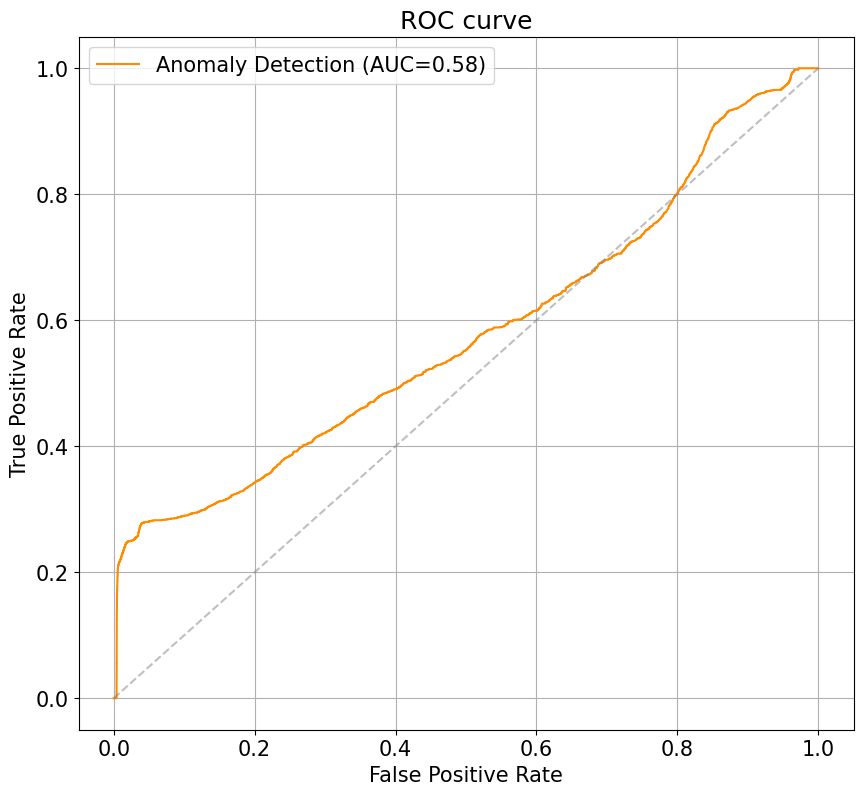


Best probability threshold: p=4.15%


In [68]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

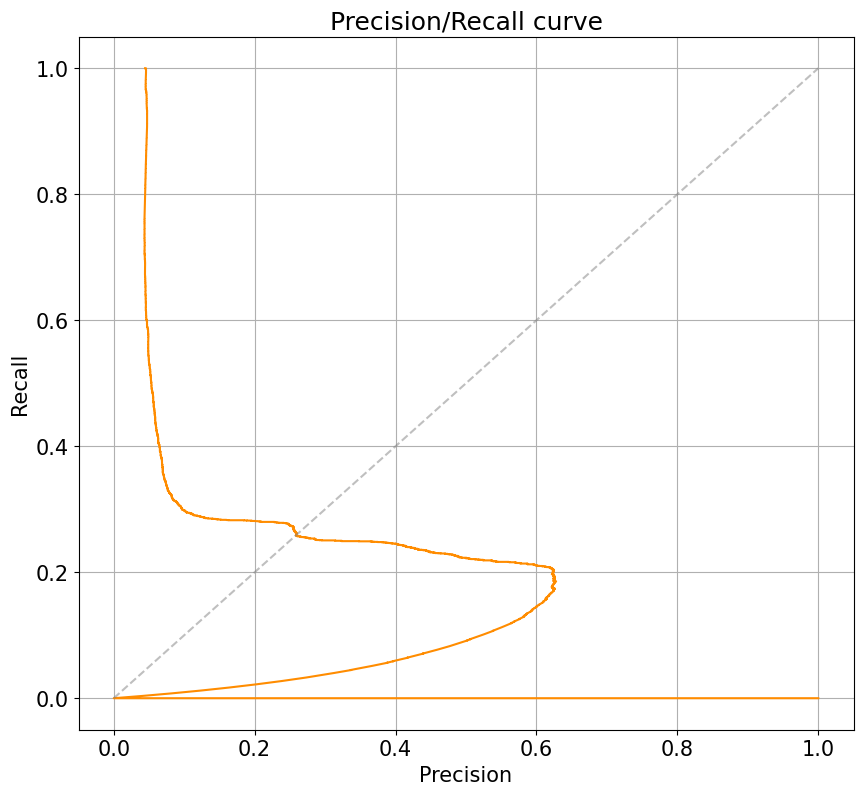

In [69]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

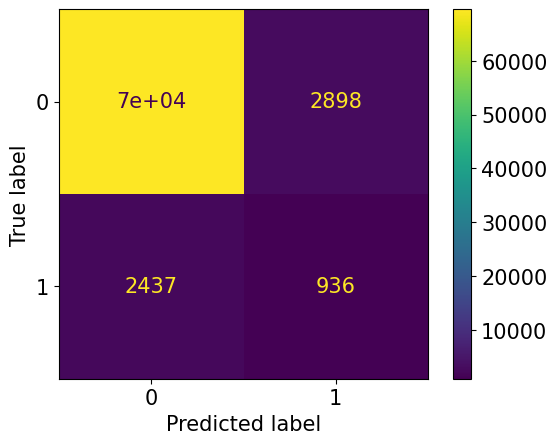


Classification Report
              precision    recall  f1-score   support

           0       0.97      0.96      0.96     72491
           1       0.24      0.28      0.26      3373

    accuracy                           0.93     75864
   macro avg       0.61      0.62      0.61     75864
weighted avg       0.93      0.93      0.93     75864



In [70]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

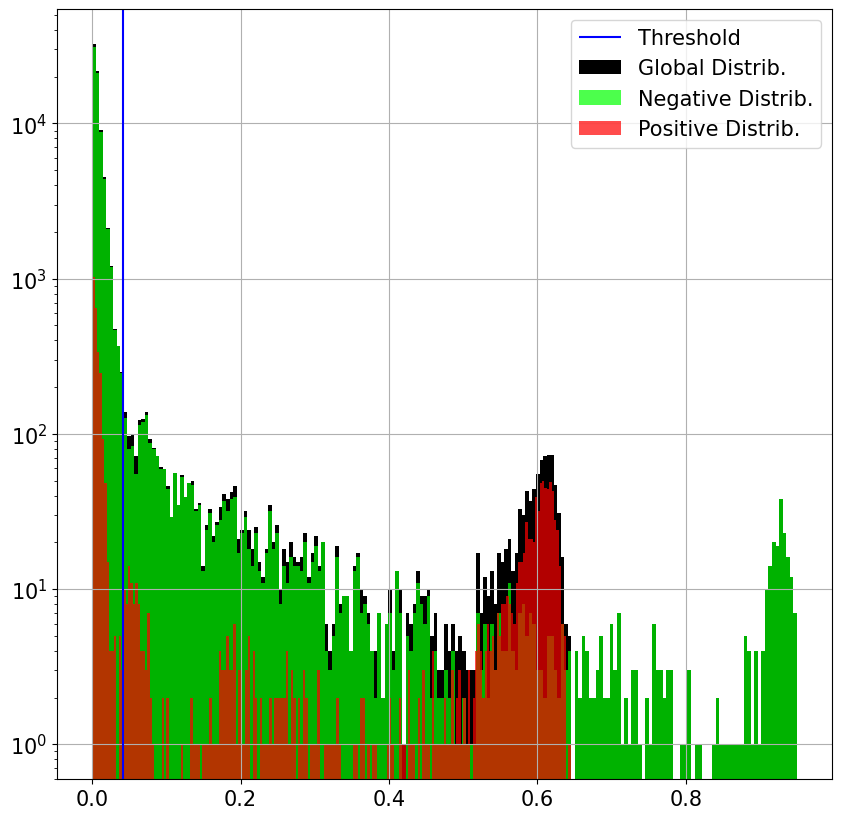

In [71]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

In [73]:
! cp -r out drive/MyDrive/HPCDATA/simple